## 匯入相關套件

In [ ]:
import numpy as np
import pandas as pd

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

import torch
import torch.nn as nn

import time
import math
import os
from datetime import datetime

import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("darkgrid")  

In [ ]:
# 確認是否可以使用 GPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
gpu_available = torch.cuda.is_available()

## 自定義函式、類別

In [ ]:
class LSTM(nn.Module):
  
    def __init__(self, input_dim, hidden_dim, num_layers, output_dim):
        super(LSTM, self).__init__()
        
        self.hidden_dim = hidden_dim 
        self.num_layers = num_layers
        
        self.lstm = nn.LSTM(input_dim, hidden_dim, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)
        
    def forward(self, x):
        
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_dim).to(device).requires_grad_()
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_dim).to(device).requires_grad_()
        
        out, (hn, cn) = self.lstm(x, (h0.detach(), c0.detach()))
        out, (hn, cn) = self.lstm(x, (h0.detach(), c0.detach()))
        out = self.fc(out[:, -1, :])
        
        return out

In [ ]:
class GRU(nn.Module):
  
    def __init__(self, input_dim, hidden_dim, num_layers, output_dim):
        
        super(GRU, self).__init__()
        self.hidden_dim = hidden_dim
        self.num_layers = num_layers
        
        self.gru = nn.GRU(input_dim, hidden_dim, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_dim).to(device).requires_grad_()
        
        out, (hn) = self.gru(x, (h0.detach()))
        out = self.fc(out[:, -1, :])
        
        return out

In [ ]:
def stock(id):
    
    stockdate = f[f['name']==str(id)].loc[:,'date']
    stockdf = f[f['name']==str(id)].dropna(axis=1).loc[:,'open':'volume']
    #print(df)
    
    return stockdf, stockdate

In [ ]:
def split_data(stock, lookback, gapspace=0, test_set_size=120):
    
    # data_raw = stock.to_numpy() # convert to numpy array
    data_raw = stock
    data = []
    
    # create all possible sequences of length seq_len
    for index in range(len(data_raw) - lookback): 
        data.append(data_raw[index: index + lookback,:])
    
    data = np.array(data);

    # test_set_size = int(np.round(0.2*data.shape[0]));
    train_set_size = data.shape[0] - (test_set_size);
    
    x_train = data[:train_set_size,:-1-gapspace,:]
    y_train = data[:train_set_size,-1,3:4]
    x_test = data[train_set_size:,:-1-gapspace,:]
    y_test = data[train_set_size:,-1,3:4]
  
    x_train = torch.from_numpy(x_train).type(torch.Tensor)
    y_train= torch.from_numpy(y_train).type(torch.Tensor)
    x_test = torch.from_numpy(x_test).type(torch.Tensor)
    y_test= torch.from_numpy(y_test).type(torch.Tensor)
            
    x_train = x_train.to(device)
    y_train= y_train.to(device)
    x_test = x_test.to(device)
    y_test= y_test.to(device)
        
    return x_train, y_train, x_test, y_test

In [ ]:
def model_train_predict(ID=None, input_dim=None, epochs=500, model_name='LSTM',
                        x_train=None, y_train=None, x_test=None, y_test=None, scalertar=None):
      
    mseloss_train = np.zeros(epochs)
    mseloss_test = np.zeros(epochs)
    all_y_train_pred = []
    all_y_test_pred = []
    
    if model_name == 'LSTM':
        
        model = LSTM(input_dim=input_dim, hidden_dim=32, output_dim=1, num_layers=2)
        model = model.to(device)
        
        criterion = torch.nn.MSELoss(reduction='mean')
        optimiser = torch.optim.Adam(model.parameters(), lr=0.01)
     
    if model_name == 'GRU':
        
        model = GRU(input_dim=input_dim, hidden_dim=32, output_dim=1, num_layers=2)
        model = model.to(device)

        criterion = torch.nn.MSELoss(reduction='mean')
        optimiser = torch.optim.Adam(model.parameters(), lr=0.01)    

    for i in range(epochs):

        y_train_pred = model(x_train)
        loss = criterion(y_train_pred, y_train) 

        if (i+1)%25 == 0:

            print("Epoch ", i+1, "MSE: ", loss.item())

        mseloss_train[i] = loss.item()

        if gpu_available == False:  

            all_y_train_pred.append(scalertar.inverse_transform(y_train_pred.detach().numpy()))  

        else:

            all_y_train_pred.append(scalertar.inverse_transform(y_train_pred.cpu().detach().numpy()))                

        optimiser.zero_grad()
        loss.backward()
        optimiser.step()

        y_test_pred = model(x_test)
        losst = criterion(y_test_pred, y_test) 
        mseloss_test[i] = losst.item()

        if gpu_available == False:

            all_y_test_pred.append(scalertar.inverse_transform(y_test_pred.detach().numpy()))

        else:

            all_y_test_pred.append(scalertar.inverse_transform(y_test_pred.cpu().detach().numpy()))
            
    print('-'*80)        
    
    if os.path.exists('data/model') is False:
      
        os.makedirs('data/model')
    
    # 模型存檔
    path = f'data/model/{ID}_{model_name}_epoch{epochs}.pth'
    torch.save(model.state_dict(), path)
    
    return all_y_train_pred, all_y_test_pred, mseloss_train, mseloss_test

In [ ]:
def Train_Data_Stock_Trend_Plot(y_train, y_train_pred, train_date_list=None, ID=None, model_name=None):
    
    fig = plt.figure(figsize=(16, 12))

    # 日期格式修正
    x= [datetime.strptime(str(d), '%Y-%m-%d').date() for d in train_date_list]

    ax = sns.lineplot(x=x, y=y_train.ravel(), label="Historical Data", color='royalblue')
    ax = sns.lineplot(x=x, y=y_train_pred.ravel(), label= f'{model_name} Train Prediction', color='tomato')
    ax.set_title(f'{ID}  {model_name} Train Data Stock Trend', size = 20, fontweight='bold')
    ax.set_xlabel('Year', size = 18)
    ax.set_ylabel('Stock Price (TWD)', size = 18)
    ax.set_xticklabels('', size=10)
    plt.legend(fontsize='xx-large', loc='upper left')

    #设置 x 轴主刻度格式
    alldays =  mdates.YearLocator()                           #主刻度为每年
    ax.xaxis.set_major_locator(alldays)                       #设置主刻度
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y')) 

    plt.legend(fontsize='xx-large', loc='upper left')
    plt.tick_params(labelsize = 16)
    #plt.gcf().autofmt_xdate()

    if os.path.exists('data/fig') is False:
      
        os.makedirs('data/fig')

    #plt.show()
    fig.savefig(f'data/fig/{ID}_{model_name}_Train_Data_Stock_Trend.png')

In [ ]:
def Test_Data_Stock_Trend_Plot(y_test, y_test_pred, test_date_list=None, ID=None, model_name=None):
    
    fig = plt.figure(figsize=(16, 12))

    x= [datetime.strptime(str(d), '%Y-%m-%d').date() for d in test_date_list]

    ax = sns.lineplot(x=x, y=y_test.ravel(), label='Historical Data')
    ax = sns.lineplot(x=x, y=y_test_pred.ravel(), label=f'{model_name} Test Prediction')
    ax.set_title(f'{ID}  {model_name} Test Data Stock Trend', size = 20, fontweight='bold')
    ax.set_xlabel('Month', size = 18)
    ax.set_ylabel('Stock price (TWD)', size = 18)

    alldays =  mdates.MonthLocator()                          
    ax.xaxis.set_major_locator(alldays)                       
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m')) 

    plt.legend(fontsize='xx-large', loc='upper left')
    plt.tick_params(labelsize=16)
    #plt.gcf().autofmt_xdate()

    if os.path.exists('data/fig') is False:
      
        os.makedirs('data/fig')

    #plt.show()
    fig.savefig(f'data/fig/{ID}_{model_name}_Test_Data_Stock_Trend.png')

In [ ]:
def LSTM_GRU_Data_Stock_Trend_Plot(y_test, lstmdata, grudata, test_date_list=None, ID=None):
    
    fig = plt.figure(figsize=(16, 12))

    x= [datetime.strptime(str(d), '%Y-%m-%d').date() for d in test_date_list]

    ax = sns.lineplot(x=x, y=y_test.ravel(), label='Historical Data')
    ax = sns.lineplot(x=x, y=lstmdata.ravel(), label=f'LSTM Test Prediction')
    ax = sns.lineplot(x=x, y=grudata.ravel(), label=f'GRU Test Prediction')
    ax.set_title(f'{ID}  Test Data Stock Trend', size = 20, fontweight='bold')
    ax.set_xlabel('Month', size = 18)
    ax.set_ylabel('Stock price (TWD)', size = 18)

    alldays =  mdates.MonthLocator()                          
    ax.xaxis.set_major_locator(alldays)                       
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m')) 

    plt.legend(fontsize='xx-large', loc='upper left')
    plt.tick_params(labelsize=16)
    #plt.gcf().autofmt_xdate()

    if os.path.exists('data/fig') is False:
      
        os.makedirs('data/fig')

    #plt.show()
    fig.savefig(f'data/fig/{ID}_Both_LSTM_GRU_Test_Data_Stock_Trend.png')

In [ ]:
def RMSE_MSELOSS_Plot(allTrainRMSE, allTestRMSE, mseloss_train, mseloss_test, ID=None, model_name=None):
    
    fig = plt.figure()
    fig.subplots_adjust(hspace=0.2, wspace=0.2)

    plt.subplot(1, 2, 1)
    ax = sns.lineplot(data=allTrainRMSE, label='Train Data')
    ax = sns.lineplot(data=allTestRMSE, label='Test Data')
    ax.set_xlabel('Epoch', size = 16)
    ax.set_title(f'{ID}  {model_name} RMSE', size = 18, fontweight='bold')
    plt.tick_params(labelsize=14)
    plt.legend(fontsize='x-large', loc='upper right')

    plt.subplot(1, 2, 2)
    ax = sns.lineplot(data=mseloss_train, label='Train Data')
    ax = sns.lineplot(data=mseloss_test, label='Test Data')
    ax.set_xlabel('Epoch', size = 16)
    ax.set_title(f'{ID}  {model_name} MSE Loss', size = 18, fontweight='bold')
    plt.tick_params(labelsize=14)
    plt.legend(fontsize='x-large', loc='upper right')

    fig.set_figheight(6)
    fig.set_figwidth(16)
    
    if os.path.exists('data/fig') is False:
      
        os.makedirs('data/fig')

    #plt.show()
    fig.savefig(f'data/fig/{ID}_{model_name}_RMSE_MSELOSS.png')

In [ ]:
def Stock_predict_process(ID, epochs, model_name, train_date_list=None, test_date_list=None):

    # 單獨 close 值的 scaler -> scalertar
    scalertar = MinMaxScaler()
    scalertar_data = scalertar.fit_transform(df.iloc[:,3].values.reshape(-1, 1))

    # 全部進行 scaler
    scaler = MinMaxScaler()
    scaler_data = scaler.fit_transform(df.values)

    # 分割資料，訓練維度(總天數, 以幾天來預測最後一天股價的天數，特徵值數量)，目標維度(總天數, 幾天後的股價值)
    x_train, y_train, x_test, y_test = split_data(scaler_data, lookback=lookback, gapspace=0, test_set_size=test_set_size)

    # 放入模型並訓練，得到預測值
    all_y_train_pred, all_y_test_pred, mseloss_train, mseloss_test = model_train_predict(ID=ID, input_dim=df.shape[1], 
                                                                                         epochs=epochs, model_name=model_name, 
                                                                                         x_train=x_train, y_train=y_train, 
                                                                                         x_test=x_test, y_test=y_test, 
                                                                                         scalertar=scalertar)

    # 將 tensor 換回 numpy
    if gpu_available == False:

        y_train = scalertar.inverse_transform(y_train.detach().numpy())
        y_test = scalertar.inverse_transform(y_test.detach().numpy())   

    else:

        y_train = scalertar.inverse_transform(y_train.cpu().detach().numpy())
        y_test = scalertar.inverse_transform(y_test.cpu().detach().numpy())

    # 算出每一個 epoch 中 訓練與測試的 RMSE值
    allTrainRMSE = []
    allTestRMSE = []

    for i in range(len(all_y_train_pred)):
      
        allTrainRMSE.append(math.sqrt(mean_squared_error(y_train[:,0], all_y_train_pred[i][:,0])))
        allTestRMSE.append(math.sqrt(mean_squared_error(y_test[:,0], all_y_test_pred[i][:,0])))


    # 畫圖
    # Train_Data_Stock_Trend_Plot
    Train_Data_Stock_Trend_Plot(y_train, all_y_train_pred[-1], train_date_list=train_date_list, ID=ID, model_name=model_name)
    
    # RMSE_MSELOSS_Plot
    RMSE_MSELOSS_Plot(allTrainRMSE, allTestRMSE, mseloss_train, mseloss_test, ID=ID, model_name=model_name)
    
    dfmseplot = pd.DataFrame({f'allTrainRMSE_{model_name}':allTrainRMSE,
                          f'allTestRMSE_{model_name}':allTestRMSE,
                          f'mseloss_train_{model_name}':mseloss_train,
                          f'mseloss_test_{model_name}':mseloss_test})
    
    # Test_Data_Stock_Trend_Plot    
    Test_Data_Stock_Trend_Plot(y_test, all_y_test_pred[-1], test_date_list=test_date_list, ID=ID, model_name=model_name)
    
    dfpred = pd.DataFrame({'date':train_date_list + test_date_list,
                       'split':['train']*len(train_date_list) + ['test']*len(test_date_list),
                       'historical':list(y_train.ravel()) + list(y_test.ravel()),
                       f'prediction_{model_name}':list(all_y_train_pred[-1].ravel()) + list(all_y_test_pred[-1].ravel())})
    
    
    # 計算 RMSE, R2, AdjR2
    trainRMSE = math.sqrt(mean_squared_error(y_train[:,0], all_y_train_pred[i][:,0]))
    testRMSE = math.sqrt(mean_squared_error(y_test[:,0], all_y_test_pred[i][:,0]))
    
    trainR2 = r2_score(y_train[:,0], all_y_train_pred[-1][:,0])
    testR2 = r2_score(y_test[:,0], all_y_test_pred[-1][:,0])

    trainAdjR2 = 1-(1-trainR2)*((len(x_train)-1)/(len(x_train)-x_train.shape[2]-1))
    testAdjR2 = 1-(1-testR2)*((len(x_test)-1)/(len(x_test)-x_test.shape[2]-1))

    dfscore = pd.DataFrame({'name':[f'{ID}', f'{ID}'],
                            'modelname':[f'{model_name}', f'{model_name}'],
                            'split': ['Train', 'Test'],
                            'RMSE': [trainRMSE, testRMSE],
                            'R2 Score': [trainR2, testR2],
                            'Adj R2 Score': [trainAdjR2, testAdjR2]})

    return dfmseplot, dfpred, dfscore

# START

In [ ]:
# 檔案讀取大表
f = pd.read_csv('rawdata/clean_long_dataset.csv')

In [ ]:
# 列出所有股票
names = list(f['name'].unique())

In [ ]:
# 紀錄一下各自的時間
timelist = []
metrics_score = []

x_train.shape =  (2306, 9, 5)
y_train.shape =  (2306, 1)
x_test.shape =  (120, 9, 5)
y_test.shape =  (120, 1)
--------------------------------------------------------------------------------
Epoch  25 MSE:  0.0012109748786315322
Epoch  50 MSE:  0.001000467804260552
Epoch  75 MSE:  0.0006580504705198109
Epoch  100 MSE:  0.0005878530791960657
Epoch  125 MSE:  0.0005367249250411987
Epoch  150 MSE:  0.0004913274897262454
Epoch  175 MSE:  0.0004433149588294327
Epoch  200 MSE:  0.0004013006400782615
Epoch  225 MSE:  0.0003684238181449473
Epoch  250 MSE:  0.0003392674552742392
Epoch  275 MSE:  0.00031345413299277425
Epoch  300 MSE:  0.00030995006090961397
Epoch  325 MSE:  0.00027918542036786675
Epoch  350 MSE:  0.0002677557640708983
Epoch  375 MSE:  0.0002576191327534616
Epoch  400 MSE:  0.0002492611820343882
Epoch  425 MSE:  0.00025055580772459507
Epoch  450 MSE:  0.00023808448167983443
Epoch  475 MSE:  0.00023251364473253489
Epoch  500 MSE:  0.00022859695309307426
--------------------------

<ipython-input-10-4a39e9a204ed>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(16, 12))


x_train.shape =  (2306, 9, 5)
y_train.shape =  (2306, 1)
x_test.shape =  (120, 9, 5)
y_test.shape =  (120, 1)
--------------------------------------------------------------------------------
Epoch  25 MSE:  0.000891570933163166
Epoch  50 MSE:  0.0002817125932779163
Epoch  75 MSE:  0.00020028353901579976
Epoch  100 MSE:  0.00017824608949013054
Epoch  125 MSE:  0.00016340846195816994
Epoch  150 MSE:  0.00015163047646638006
Epoch  175 MSE:  0.00014104116417001933
Epoch  200 MSE:  0.00013055381714366376
Epoch  225 MSE:  0.00011986282333964482
Epoch  250 MSE:  0.00011107479804195464
Epoch  275 MSE:  0.0001380081521347165
Epoch  300 MSE:  0.00011201167944818735
Epoch  325 MSE:  0.00010299061250407249
Epoch  350 MSE:  9.822572610573843e-05
Epoch  375 MSE:  9.533045522402972e-05
Epoch  400 MSE:  9.301580575993285e-05
Epoch  425 MSE:  9.086559293791652e-05
Epoch  450 MSE:  8.878429071046412e-05
Epoch  475 MSE:  8.672978583490476e-05
Epoch  500 MSE:  8.467374573228881e-05
-----------------------

Epoch  450 MSE:  0.00025806145276874304
Epoch  475 MSE:  0.00025614220066927373
Epoch  500 MSE:  0.0002544777817092836
--------------------------------------------------------------------------------
x_train.shape =  (2306, 9, 5)
y_train.shape =  (2306, 1)
x_test.shape =  (120, 9, 5)
y_test.shape =  (120, 1)
--------------------------------------------------------------------------------
Epoch  25 MSE:  0.0002348038979107514
Epoch  50 MSE:  0.00020799433696083724
Epoch  75 MSE:  0.00013690291962120682
Epoch  100 MSE:  0.00012738200894091278
Epoch  125 MSE:  0.00011960465781157836
Epoch  150 MSE:  0.00011269927927060053
Epoch  175 MSE:  0.00010620043758535758
Epoch  200 MSE:  9.984031203202903e-05
Epoch  225 MSE:  9.348602179670706e-05
Epoch  250 MSE:  8.746388630243018e-05
Epoch  275 MSE:  8.262250776169822e-05
Epoch  300 MSE:  7.937626651255414e-05
Epoch  325 MSE:  7.698918489040807e-05
Epoch  350 MSE:  7.483523950213566e-05
Epoch  375 MSE:  7.284017192432657e-05
Epoch  400 MSE:  7.12

Epoch  300 MSE:  7.225786976050586e-05
Epoch  325 MSE:  6.95742855896242e-05
Epoch  350 MSE:  6.716514326399192e-05
Epoch  375 MSE:  6.499926530523226e-05
Epoch  400 MSE:  6.305021815933287e-05
Epoch  425 MSE:  6.129516987130046e-05
Epoch  450 MSE:  5.971421342110261e-05
Epoch  475 MSE:  5.828972643939778e-05
Epoch  500 MSE:  5.700617111870088e-05
--------------------------------------------------------------------------------
x_train.shape =  (2306, 9, 5)
y_train.shape =  (2306, 1)
x_test.shape =  (120, 9, 5)
y_test.shape =  (120, 1)
--------------------------------------------------------------------------------
Epoch  25 MSE:  0.0005941643612459302
Epoch  50 MSE:  0.00011811392323579639
Epoch  75 MSE:  6.928064249223098e-05
Epoch  100 MSE:  5.767762559116818e-05
Epoch  125 MSE:  5.215610872255638e-05
Epoch  150 MSE:  4.888280818704516e-05
Epoch  175 MSE:  4.6298624511109665e-05
Epoch  200 MSE:  4.397962402435951e-05
Epoch  225 MSE:  4.1914256144082174e-05
Epoch  250 MSE:  4.02087098

Epoch  150 MSE:  3.912497777491808e-05
Epoch  175 MSE:  3.759024912142195e-05
Epoch  200 MSE:  3.6208246456226334e-05
Epoch  225 MSE:  3.4963562939083204e-05
Epoch  250 MSE:  3.384413867024705e-05
Epoch  275 MSE:  3.2839419873198494e-05
Epoch  300 MSE:  3.194003147655167e-05
Epoch  325 MSE:  3.113733328063972e-05
Epoch  350 MSE:  3.0423143471125513e-05
Epoch  375 MSE:  2.978935299324803e-05
Epoch  400 MSE:  2.922793646575883e-05
Epoch  425 MSE:  2.873084849852603e-05
Epoch  450 MSE:  2.829028744599782e-05
Epoch  475 MSE:  2.789885547826998e-05
Epoch  500 MSE:  2.7549820515559986e-05
--------------------------------------------------------------------------------
x_train.shape =  (2306, 9, 5)
y_train.shape =  (2306, 1)
x_test.shape =  (120, 9, 5)
y_test.shape =  (120, 1)
--------------------------------------------------------------------------------
Epoch  25 MSE:  0.0011292587732896209
Epoch  50 MSE:  0.00038801474147476256
Epoch  75 MSE:  0.00020938951638527215
Epoch  100 MSE:  0.000

Epoch  50 MSE:  0.00018961713067255914
Epoch  75 MSE:  0.00011364420788595453
Epoch  100 MSE:  9.996194421546534e-05
Epoch  125 MSE:  9.111803228734061e-05
Epoch  150 MSE:  8.444804552709684e-05
Epoch  175 MSE:  7.907697727205232e-05
Epoch  200 MSE:  7.471775461453944e-05
Epoch  225 MSE:  7.11528628016822e-05
Epoch  250 MSE:  6.82142999721691e-05
Epoch  275 MSE:  6.577179010491818e-05
Epoch  300 MSE:  6.37231205473654e-05
Epoch  325 MSE:  6.198709888849407e-05
Epoch  350 MSE:  6.0499012761283666e-05
Epoch  375 MSE:  5.920782496104948e-05
Epoch  400 MSE:  5.8073903346667066e-05
Epoch  425 MSE:  5.7066852605203167e-05
Epoch  450 MSE:  5.616383350570686e-05
Epoch  475 MSE:  5.5347529269056395e-05
Epoch  500 MSE:  5.4604930483037606e-05
--------------------------------------------------------------------------------
x_train.shape =  (2306, 9, 5)
y_train.shape =  (2306, 1)
x_test.shape =  (120, 9, 5)
y_test.shape =  (120, 1)
------------------------------------------------------------------

x_train.shape =  (2306, 9, 5)
y_train.shape =  (2306, 1)
x_test.shape =  (120, 9, 5)
y_test.shape =  (120, 1)
--------------------------------------------------------------------------------
Epoch  25 MSE:  0.0023433819878846407
Epoch  50 MSE:  0.0001944632240338251
Epoch  75 MSE:  0.00012462175800465047
Epoch  100 MSE:  0.00010450626723468304
Epoch  125 MSE:  9.692904131952673e-05
Epoch  150 MSE:  9.034096001414582e-05
Epoch  175 MSE:  8.449684537481517e-05
Epoch  200 MSE:  7.933786400826648e-05
Epoch  225 MSE:  7.478777843061835e-05
Epoch  250 MSE:  7.07752478774637e-05
Epoch  275 MSE:  6.723855767631903e-05
Epoch  300 MSE:  6.412849324988201e-05
Epoch  325 MSE:  6.140740151749924e-05
Epoch  350 MSE:  5.904548379476182e-05
Epoch  375 MSE:  5.7016604841919616e-05
Epoch  400 MSE:  5.529451300390065e-05
Epoch  425 MSE:  5.3850264521315694e-05
Epoch  450 MSE:  5.265105573926121e-05
Epoch  475 MSE:  5.1661125326063484e-05
Epoch  500 MSE:  5.084394433652051e-05
----------------------------

Epoch  425 MSE:  4.543655904853949e-06
Epoch  450 MSE:  4.386881755635841e-06
Epoch  475 MSE:  4.246929620421724e-06
Epoch  500 MSE:  4.1268217501055915e-06
--------------------------------------------------------------------------------
x_train.shape =  (2306, 9, 5)
y_train.shape =  (2306, 1)
x_test.shape =  (120, 9, 5)
y_test.shape =  (120, 1)
--------------------------------------------------------------------------------
Epoch  25 MSE:  0.0005490375915542245
Epoch  50 MSE:  0.0002810623846016824
Epoch  75 MSE:  5.993355080136098e-05
Epoch  100 MSE:  9.712412065709941e-06
Epoch  125 MSE:  6.0986917560512666e-06
Epoch  150 MSE:  5.26621306562447e-06
Epoch  175 MSE:  4.8509550651942845e-06
Epoch  200 MSE:  4.620470917870989e-06
Epoch  225 MSE:  4.484193141252035e-06
Epoch  250 MSE:  4.391101811052067e-06
Epoch  275 MSE:  4.315886144468095e-06
Epoch  300 MSE:  4.24769177698181e-06
Epoch  325 MSE:  4.182581506029237e-06
Epoch  350 MSE:  4.119461664231494e-06
Epoch  375 MSE:  4.058215836

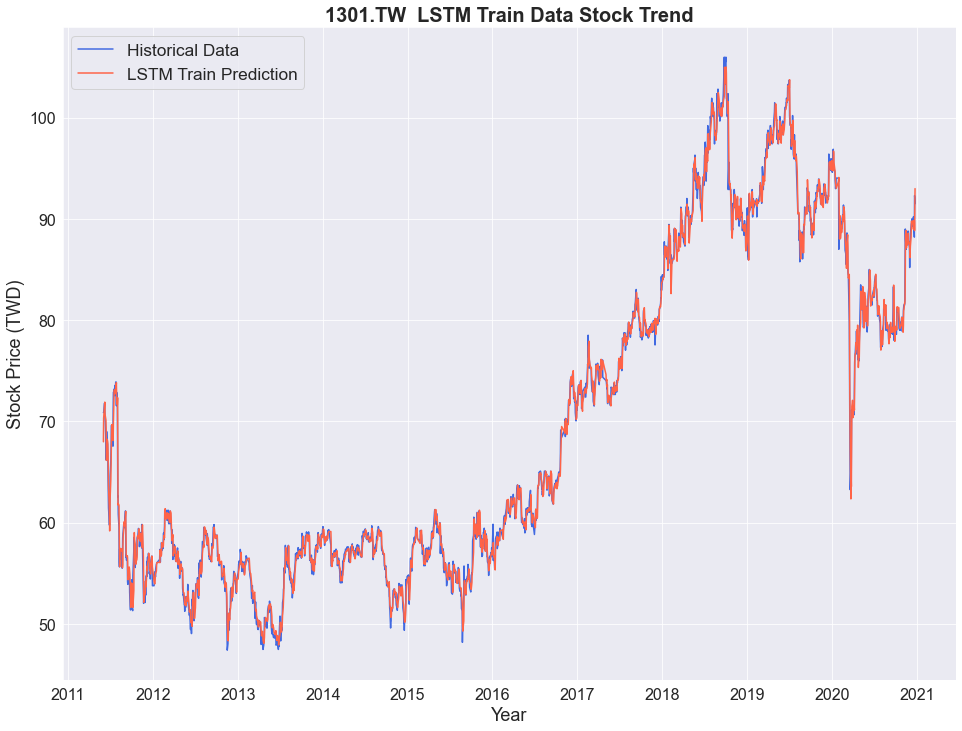

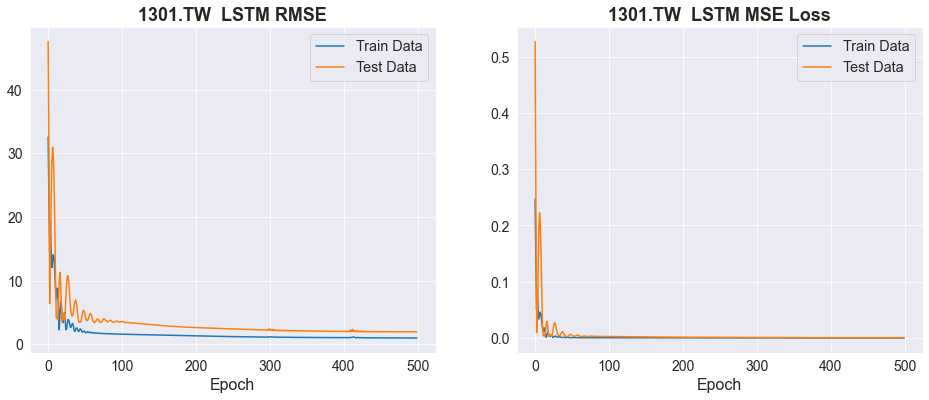

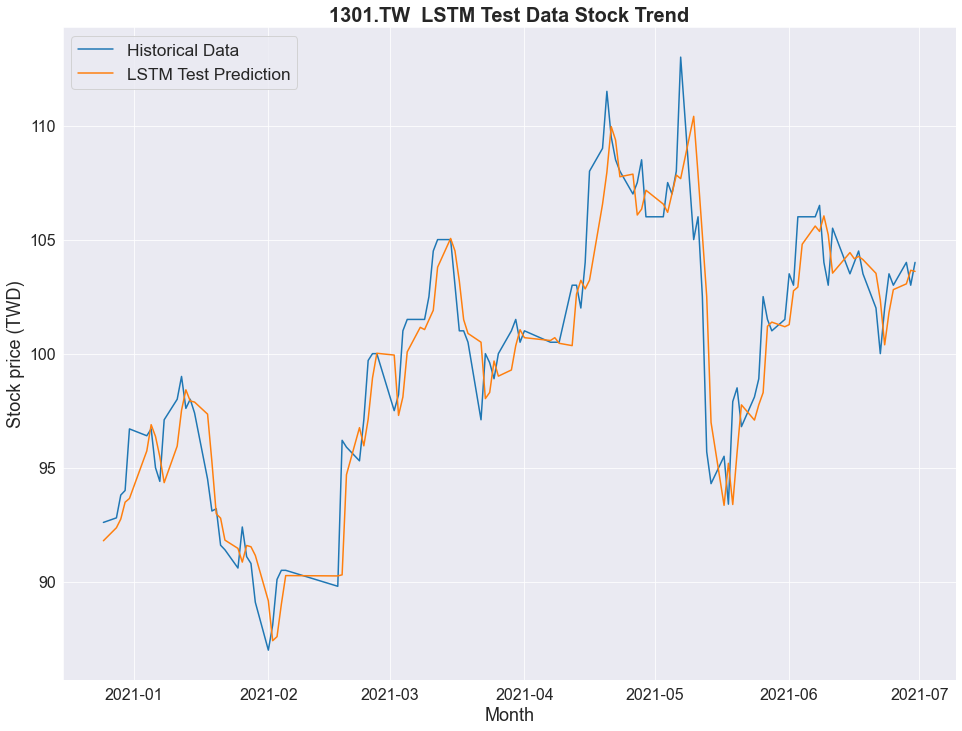

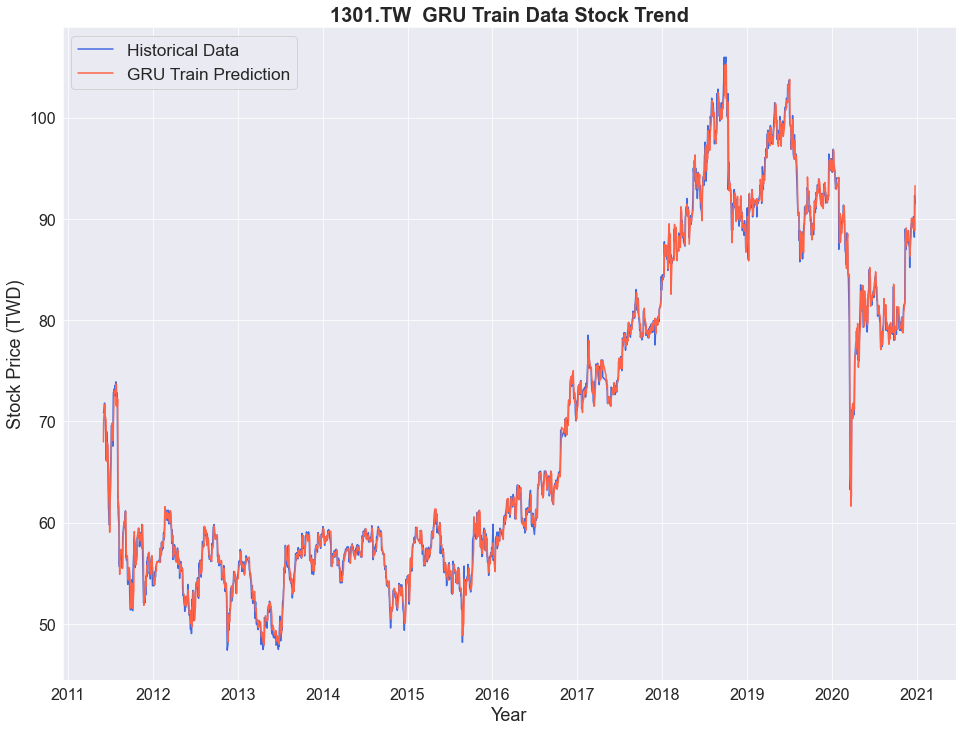

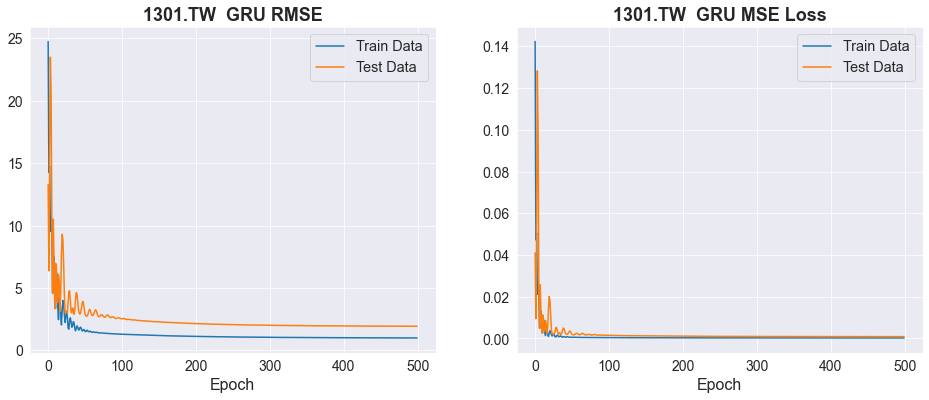

...

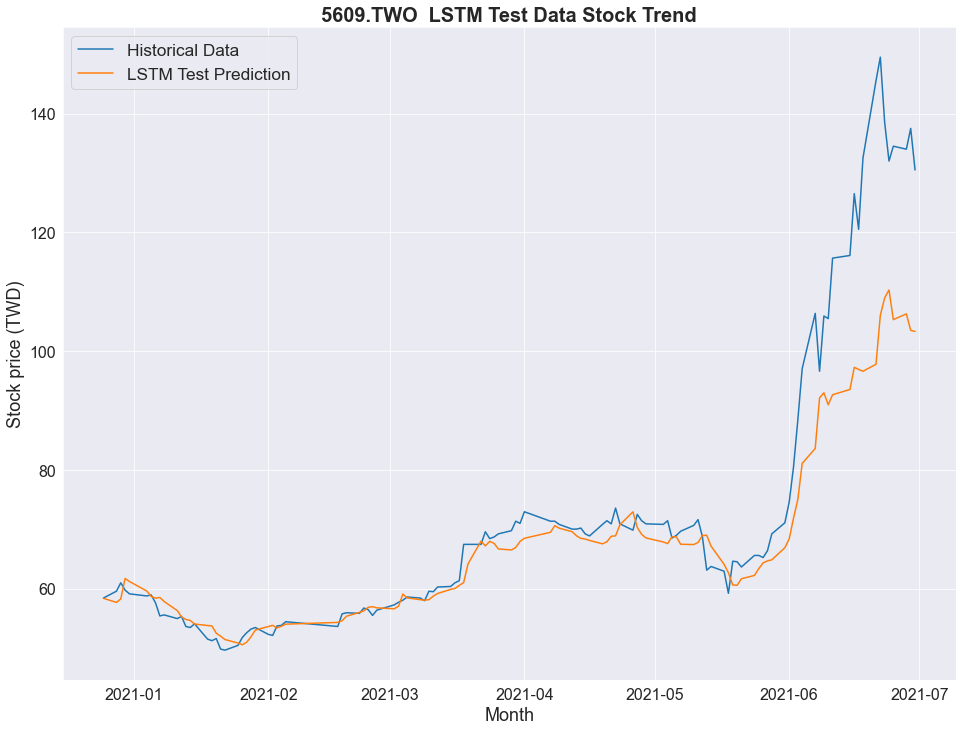

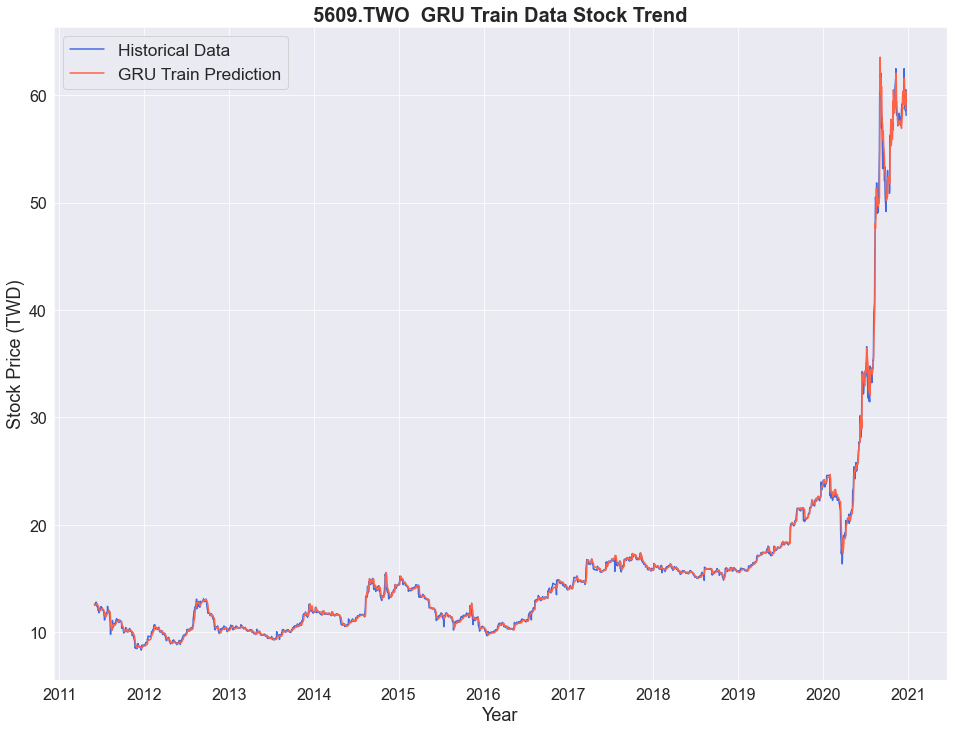

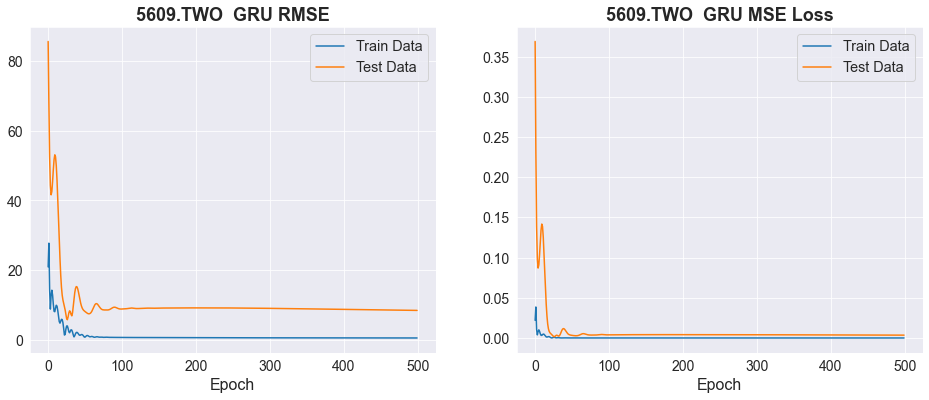

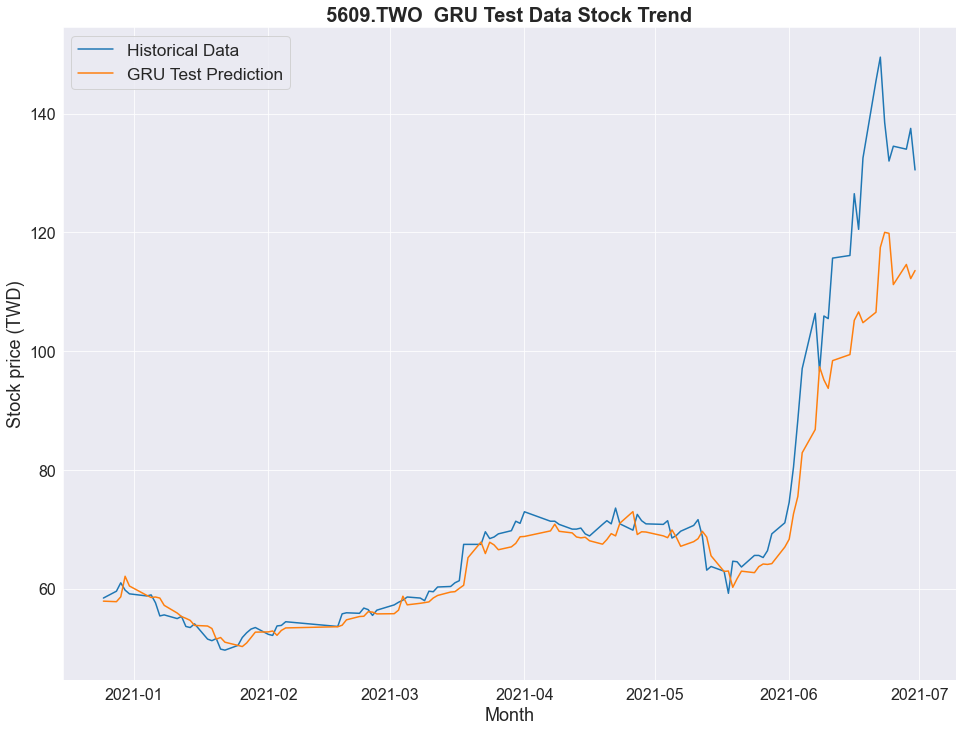

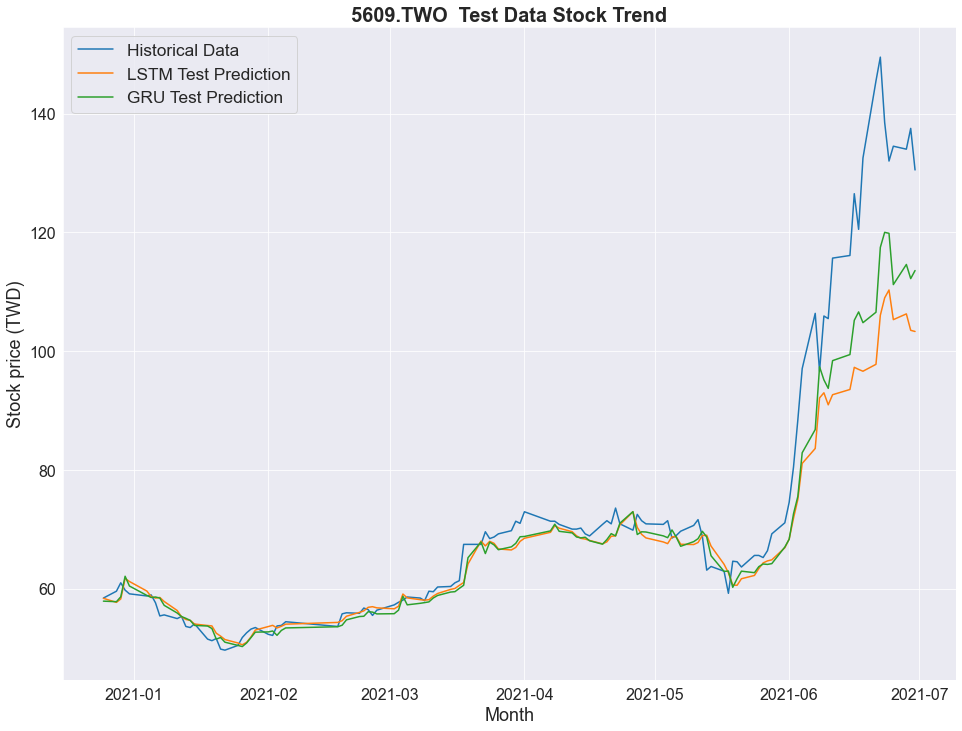

In [ ]:
for name in names[:30]:
    
    # 參數設定
    ID = name 
    lookback = 10
    test_set_size = 120
    epochs = 500

    # 選取想要的股票
    df, alldate = stock(ID)

    # 保留日期資訊
    alldatelist = list(alldate)
    train_date_list = alldatelist[lookback:-test_set_size]
    test_date_list = alldatelist[-test_set_size:]

    # LSTM
    lstmstart = time.time()
    lstmdfmseplot, lstmdfpred, lstmdfscore = Stock_predict_process(ID, epochs, model_name = 'LSTM', 
                                                                   train_date_list=train_date_list, test_date_list=test_date_list)
    lstmend = time.time()
    timelist.append(lstmend - lstmstart)
    timelist.append(lstmend - lstmstart) # 為了後面整理資料

    # GRU
    grustart = time.time()
    grudfmseplot, grudfpred, grudfscore = Stock_predict_process(ID, epochs, model_name = 'GRU', 
                                                                train_date_list=train_date_list, test_date_list=test_date_list)
    gruend = time.time()
    timelist.append(gruend - grustart)
    timelist.append(gruend - grustart)  # 為了後面整理資料

    # LSTM_GRU_Data_Stock_Trend_Plot
    LSTM_GRU_Data_Stock_Trend_Plot(lstmdfpred[lstmdfpred['split']=='test'].loc[:,'historical'].values,
                                   lstmdfpred[lstmdfpred['split']=='test'].loc[:,'prediction_LSTM'].values, 
                                   grudfpred[grudfpred['split']=='test'].loc[:,'prediction_GRU'].values,
                                   test_date_list=test_date_list, ID=ID)

    # 存檔
    dfpred = pd.concat([lstmdfpred, grudfpred.loc[:,'prediction_GRU']], axis=1)
    dfmseplot = pd.concat([lstmdfmseplot, grudfmseplot], axis=1)
    dfscore = pd.concat([lstmdfscore, grudfscore]).reset_index(drop=True)

    if os.path.exists('data/researchdata') is False:
        os.makedirs('data/researchdata')

    dfpred.to_csv(f'data/researchdata/{ID}_Prediction_Data.csv', index=False)
    dfmseplot.to_csv(f'data/researchdata/{ID}_RMSE_MSELOSS_in_Training.csv', index=False)
    
    #dfscore.to_csv(f'data/researchdata/{ID}_Metrics_and_Score_.csv', index=False)
    metrics_score.append(dfscore)

In [ ]:
all_metrics_score = pd.concat([x for x in metrics_score]).reset_index(drop=True)
all_metrics_score.insert(len(all_metrics_score.columns), 'time', timelist)
all_metrics_score.to_csv(f'data/researchdata/All_Metrics_Score_Time.csv', index=False)

In [ ]:
lstm_time = []
gru_time = []

for i in range(len(timelist)):   
    if i%4 == 0:
        lstm_time.append(timelist[i])
    if i%4 == 2:
        gru_time.append(timelist[i])

In [ ]:
dfalltime = pd.DataFrame({'name':names[:30],
                       'lstm_time':lstm_time,
                       'gru_time':gru_time})

dfalltime.to_csv(f'data/researchdata/All_Time.csv', index=False)

##### just test

In [ ]:
# load the model

# modelG = GRU(input_dim=df.shape[1], hidden_dim=32, output_dim=1, num_layers=2).to(device)
# modelG.load_state_dict(torch.load('data/model/GRU_epoch500.pth')) 

# y_test_pred = modelG(x_test)
# y_test_predG = scalertar.inverse_transform(y_test_pred.cpu().detach().numpy())

# y_test_predG
# all_y_test_pred[-1]